# Papers/ References
- [Base DCGAN Paper](https://arxiv.org/pdf/1511.06434)
- [A guide to convolution arithmetic for deep learning](https://arxiv.org/pdf/1603.07285)

# 1. Import Dependencies

In [7]:
import torch
import numpy as np
from torch import nn
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob
from tqdm import tqdm
import os

# 2. Configure Environment and Utils Definition

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [9]:
if not os.path.exists("/kaggle/working/images"):
    os.mkdir('/kaggle/working/images')

In [10]:
def show(tensor, ch = 3, size = (64,64), n_imgs = 25, epoch = 0, save=False):
    data = tensor.detach().cpu().view(-1, ch, *size)
    reshaped = make_grid(data[:n_imgs], nrow=5).permute(1,2,0) # from C,H,W to H,W,C
    plt.imshow(reshaped)
    plt.title(f"Epoch: {epoch}")
    plt.axis('off')
    if save:
        plt.savefig(f"/kaggle/working/images/fake_{epoch}.png")
    plt.show()

# 3. Preparing `DataSet` and Data loading pipeline

In [11]:
# class CarDataSet(Dataset):
#     def __init__(self, img_paths, transforms = None):
#         self.img_paths = img_paths
#         self.transforms = transforms
#         self.cache = {}

#     def __len__(self):
#         return len(self.img_paths)

#     def __getitem__(self, idx):
#         if torch.is_tensor(idx):
#             idx = idx.tolist()

#         if idx in self.cache.keys():
#             return self.cache[idx]
#         img = Image.open(self.img_paths[idx]).convert('RGB')
        
#         if self.transforms:
#             img = self.transforms(img)

#         self.cache[idx] = img        
#         return img




class CarDataSet(Dataset):
    def __init__(self, img_paths, transforms = None):
        self.transforms = transforms
        self.data = torch.from_numpy(np.array([self.read(p).numpy() for p in tqdm(img_paths)]))

    def read(self, path):
        img = Image.open(path).convert('RGB')
        
        if self.transforms:
            img = self.transforms(img)
        
        return img
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img = self.data[idx]       
        return img

In [ ]:
data_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(size=(64, 64)),
    transforms.Normalize(mean=0.5, std=0.5), # would do (pixel-0.5)/0.5
])
img_paths = glob('/kaggle/input/stanford-cars-dataset/cars_train/cars_train/*.jpg')
dataset = CarDataSet(img_paths, transforms=data_transforms)


100%|██████████| 8144/8144 [01:28<00:00, 92.28it/s]


In [21]:
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=4) # Here only the change in batch size for better GPU performance

# 4. Coding Models

## 4.1 Defining Generator

In [13]:
class Generator(nn.Module):
    def __init__(self, z_dim = 100, img_width = 64, output_channels = 3):
        """z_dim : Latent dimension of noise
        img_width : width of image to be generated. Should be power of 2.
        output_channels : number of channels to be generated"""
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.img_width = img_width

        self.linear = nn.Sequential(
            nn.Linear(z_dim, (1024 * (img_width //2**4) ** 2)), # will be reshaped to 1024, 4, 4 = 1024 * (64/2**4)**2 = 1024 * 4**2 = 1024*16
            nn.ReLU(inplace=True)
        )

        self.conv_block = nn.Sequential(
            nn.ConvTranspose2d(in_channels=1024, out_channels=512, stride=2, kernel_size=4, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=512, out_channels=256, stride=2, kernel_size=4, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=256, out_channels=128, stride=2, kernel_size=4, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=128, out_channels=output_channels, stride=2, kernel_size=4, padding=1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, noise):
        projected = self.linear(noise)
        reshape_width = self.img_width // 2**4

        reshaped = projected.view(noise.shape[0], 1024, reshape_width, reshape_width) # B,C,H,W
        conved = self.conv_block(reshaped)

        return conved

## 4.2 Defining Discriminator

In [14]:
class Discrinimator(nn.Module):
    def __init__(self, img_width = 64, input_channels = 3):
        super(Discrinimator, self).__init__()
        self.img_width = img_width

        self.model = nn.Sequential(
            nn.Conv2d(in_channels=input_channels, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=0, bias=False),
            nn.Sigmoid(),
        )
    
    def forward(self, images):
        conved = self.model(images)
        return conved.view(conved.shape[0], 1)

## 4.3 Initializing Parameters

In [15]:
def init_params(module):
    if module.__class__.__name__.find('Conv')!=-1: # Conv Layers with only weights
        nn.init.normal_(module.weight.data, mean=0.0, std=0.02) # as per section 4 in base paper
    elif module.__class__.__name__.find('BatchNorm')!=-1:
        nn.init.normal_(module.weight.data, mean=1.0, std=0.02)
        nn.init.constant_(module.bias.data, 0.0)

## 4.4 Defining noise and loss functions

In [16]:
def get_noise(batch_size, z_dim):
    noise = torch.randn(batch_size, z_dim).to(device)
    return noise

def gen_loss(base_loss, gen_model, disc_model, batch_size, z_dim):
    noise = get_noise(batch_size, z_dim)
    
    fake_img = gen_model(noise)
    fake_pred = disc_model(fake_img)

    fake_label = torch.ones_like(fake_pred)*0.95

    loss = base_loss(fake_pred, fake_label)

    return loss

def disc_loss(base_loss, gen_model, disc_model, real_images, batch_size, z_dim):
    noise = get_noise(batch_size, z_dim)

    fake_img = gen_model(noise)

    fake_pred = disc_model(fake_img.detach()) # to not condiser generator while training discriminator
    real_pred = disc_model(real_images)

    fake_label = torch.zeros_like(fake_pred)+0.05
    real_label = torch.ones_like(real_pred)*0.95

    fake_loss = base_loss(fake_pred, fake_label)
    real_loss = base_loss(real_pred, real_label)

    return (fake_loss + real_loss)/2

# 5. Training Setup and Training

## 5.1 Defining Hyper Parameters

In [17]:
# hyper params
z_dim = 100
lr = 0.0002
beta1 = 0.5
beta2 = 0.999
epochs = 200
save_freq = 5

## 5.2 Creating model instances and initializing params

In [18]:
generator = Generator(z_dim=z_dim, img_width=64, output_channels=3)
discriminator = Discrinimator(img_width=64, input_channels=3)

# initialize weights
generator = generator.apply(init_params)
discriminator = discriminator.apply(init_params)

# move models to device
generator = generator.to(device)
discriminator = discriminator.to(device)

## 5.3 Defining base loss and optimizers

In [19]:
loss_fn = nn.BCELoss()

gen_opt = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2)) # as per secton 4 in paper
disc_opt = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2)) # as per secton 4 in paper

## 5.4 Training loop and model training

100%|██████████| 64/64 [00:09<00:00,  6.79it/s]


Epoch: 0/200, Generator Loss: 2.4923302691671374, Discriminator Loss: 0.44483193538512134


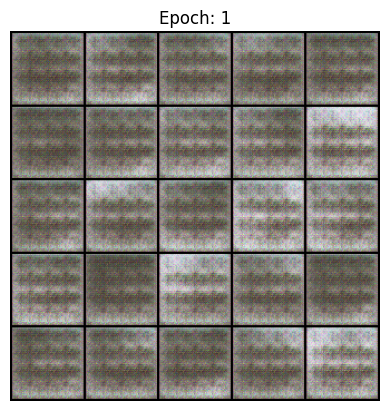

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 1/200, Generator Loss: 1.7696990245451862, Discriminator Loss: 0.5438203640677371


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 2/200, Generator Loss: 1.9290969479529, Discriminator Loss: 0.5343167233794986


100%|██████████| 64/64 [00:09<00:00,  6.72it/s]


Epoch: 3/200, Generator Loss: 2.110104894357018, Discriminator Loss: 0.49411139893391276


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 4/200, Generator Loss: 1.8776953487358767, Discriminator Loss: 0.5295732740334771


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 5/200, Generator Loss: 2.485994892410773, Discriminator Loss: 0.4881353377124884


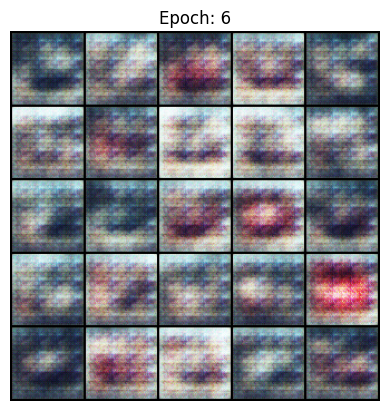

100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 6/200, Generator Loss: 2.511626585995987, Discriminator Loss: 0.4413878897786843


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 7/200, Generator Loss: 2.295690378177845, Discriminator Loss: 0.4261775862257232


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 8/200, Generator Loss: 2.506965415651063, Discriminator Loss: 0.4327040541851216


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 9/200, Generator Loss: 2.923749352485117, Discriminator Loss: 0.43070414832158266


100%|██████████| 64/64 [00:09<00:00,  6.72it/s]


Epoch: 10/200, Generator Loss: 2.7871668113940826, Discriminator Loss: 0.4454884552534062


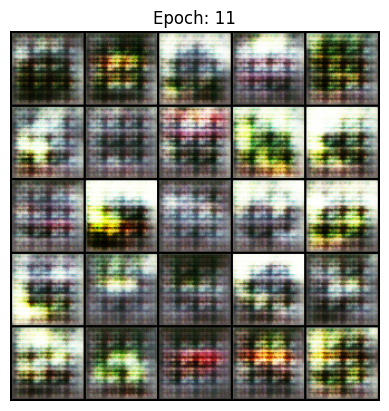

100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 11/200, Generator Loss: 2.9794462331385883, Discriminator Loss: 0.4304532394662119


100%|██████████| 64/64 [00:09<00:00,  6.70it/s]


Epoch: 12/200, Generator Loss: 2.9399450710573927, Discriminator Loss: 0.4590622487611527


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 13/200, Generator Loss: 2.663685847359228, Discriminator Loss: 0.38453447438176347


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 14/200, Generator Loss: 2.8119861344223174, Discriminator Loss: 0.4829513841621534


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 15/200, Generator Loss: 2.612706500092752, Discriminator Loss: 0.4210962380313686


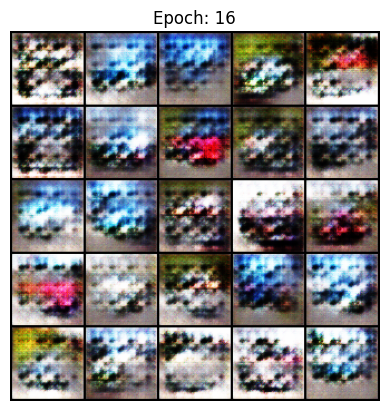

100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 16/200, Generator Loss: 2.5252120892987504, Discriminator Loss: 0.4451351355475855


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 17/200, Generator Loss: 2.734357399650079, Discriminator Loss: 0.4376741618444971


100%|██████████| 64/64 [00:09<00:00,  6.69it/s]


Epoch: 18/200, Generator Loss: 2.5359663761903355, Discriminator Loss: 0.45945254348818587


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 19/200, Generator Loss: 2.5472900844041866, Discriminator Loss: 0.43479649198547093


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 20/200, Generator Loss: 2.532016437039628, Discriminator Loss: 0.4797107799816694


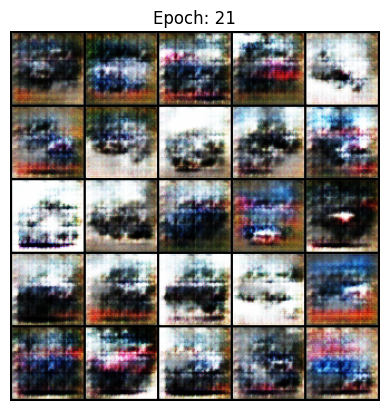

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 21/200, Generator Loss: 2.5251984137214705, Discriminator Loss: 0.4639559933853524


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 22/200, Generator Loss: 2.5313622647043763, Discriminator Loss: 0.47288978579938995


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 23/200, Generator Loss: 2.514534563821519, Discriminator Loss: 0.3943903487183022


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 24/200, Generator Loss: 2.6465906572248237, Discriminator Loss: 0.44937726673770745


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 25/200, Generator Loss: 2.9424872592764895, Discriminator Loss: 0.43909387269984995


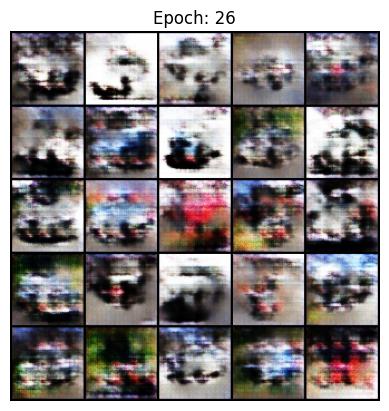

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 26/200, Generator Loss: 2.864206200732698, Discriminator Loss: 0.3793061887351375


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 27/200, Generator Loss: 2.804113388529929, Discriminator Loss: 0.44639324855008156


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 28/200, Generator Loss: 2.9456557286043297, Discriminator Loss: 0.3651553606705956


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 29/200, Generator Loss: 2.968642307873559, Discriminator Loss: 0.3525168361153256


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 30/200, Generator Loss: 3.067126317670631, Discriminator Loss: 0.3480351838943766


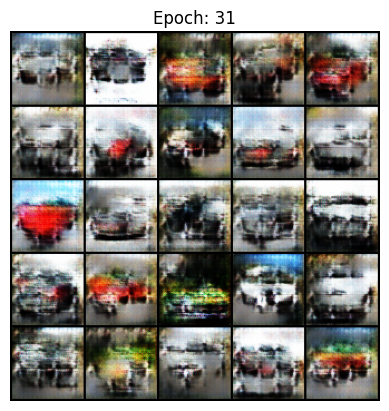

100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 31/200, Generator Loss: 2.938476631824066, Discriminator Loss: 0.4335444314892025


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 32/200, Generator Loss: 3.034494049422633, Discriminator Loss: 0.3657296520085138


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 33/200, Generator Loss: 2.9861852349841524, Discriminator Loss: 0.3851460104255639


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 34/200, Generator Loss: 2.9139420892494368, Discriminator Loss: 0.44235070117096065


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 35/200, Generator Loss: 2.7375581601748062, Discriminator Loss: 0.40625798397776186


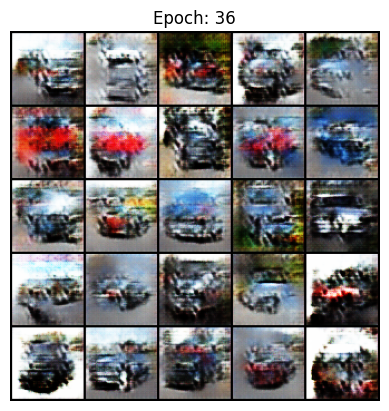

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 36/200, Generator Loss: 2.6195826872392813, Discriminator Loss: 0.4057380039471774


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 37/200, Generator Loss: 2.5764059532133676, Discriminator Loss: 0.4068390806672147


100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 38/200, Generator Loss: 2.5986625773499195, Discriminator Loss: 0.4149354106082429


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 39/200, Generator Loss: 2.5995278386563823, Discriminator Loss: 0.4631898733393851


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 40/200, Generator Loss: 2.5553958966361985, Discriminator Loss: 0.38336931043148975


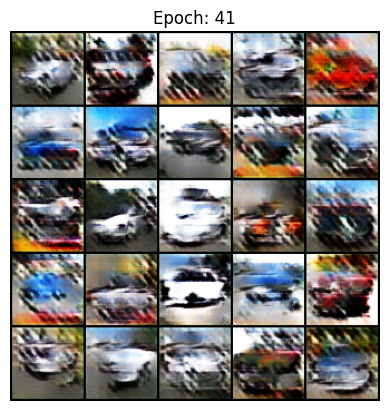

100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 41/200, Generator Loss: 2.5451647120515117, Discriminator Loss: 0.40099235982698167


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 42/200, Generator Loss: 2.578079639108804, Discriminator Loss: 0.41945226780323713


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 43/200, Generator Loss: 2.4366299469016623, Discriminator Loss: 0.37495475855229643


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 44/200, Generator Loss: 2.491513091829296, Discriminator Loss: 0.3932500877408475


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 45/200, Generator Loss: 2.6474800376854617, Discriminator Loss: 0.46351919110959544


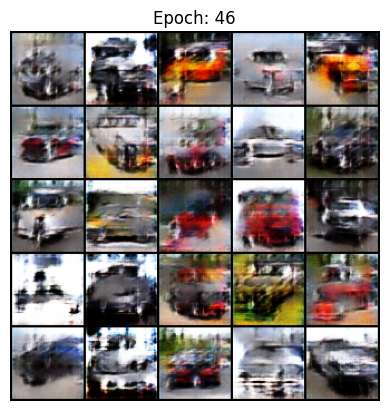

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 46/200, Generator Loss: 2.4687586416195795, Discriminator Loss: 0.4029285805281581


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 47/200, Generator Loss: 2.389290311950129, Discriminator Loss: 0.41894154885897233


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 48/200, Generator Loss: 2.3912175999174887, Discriminator Loss: 0.39098884010127577


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 49/200, Generator Loss: 2.458878571485958, Discriminator Loss: 0.3611425592295079


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 50/200, Generator Loss: 2.390272645444439, Discriminator Loss: 0.5375109455440273


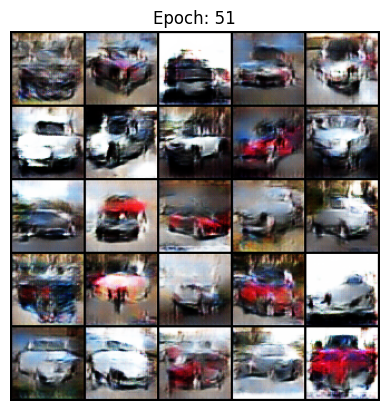

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 51/200, Generator Loss: 2.4130544756156755, Discriminator Loss: 0.3700569338789155


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 52/200, Generator Loss: 2.394820578791538, Discriminator Loss: 0.3575069693544759


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 53/200, Generator Loss: 2.4910410574705053, Discriminator Loss: 0.40297563599462827


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 54/200, Generator Loss: 2.45856397629721, Discriminator Loss: 0.4293259473001559


100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 55/200, Generator Loss: 2.5044994211384264, Discriminator Loss: 0.3596542939572999


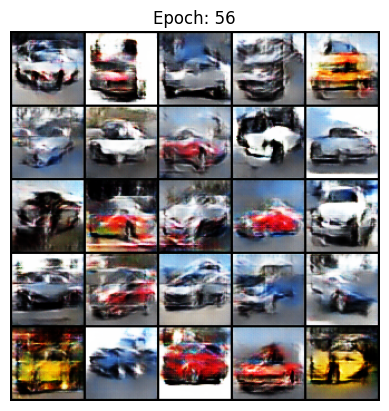

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 56/200, Generator Loss: 2.5021450336883486, Discriminator Loss: 0.3895612325087512


100%|██████████| 64/64 [00:09<00:00,  6.72it/s]


Epoch: 57/200, Generator Loss: 2.4456258265114954, Discriminator Loss: 0.39330349631300143


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 58/200, Generator Loss: 2.5368071515808404, Discriminator Loss: 0.36266975002345025


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 59/200, Generator Loss: 2.602117234925156, Discriminator Loss: 0.4198275531673244


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 60/200, Generator Loss: 2.5618186226528143, Discriminator Loss: 0.3585643166409026


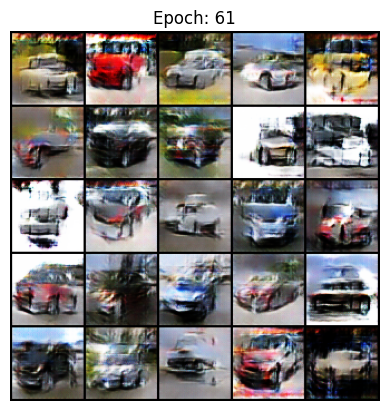

100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 61/200, Generator Loss: 2.5466149794797768, Discriminator Loss: 0.36598306818186416


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 62/200, Generator Loss: 2.514639766370852, Discriminator Loss: 0.37618787724283215


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 63/200, Generator Loss: 2.6060365632849734, Discriminator Loss: 0.39758329283746147


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 64/200, Generator Loss: 2.5331991707177903, Discriminator Loss: 0.3234222901359288


100%|██████████| 64/64 [00:09<00:00,  6.71it/s]


Epoch: 65/200, Generator Loss: 2.53941907770273, Discriminator Loss: 0.3684211698285723


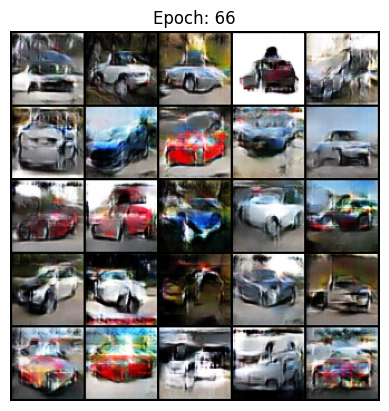

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 66/200, Generator Loss: 2.538843680926999, Discriminator Loss: 0.4431023534482495


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 67/200, Generator Loss: 2.395911113686552, Discriminator Loss: 0.3575141987304088


100%|██████████| 64/64 [00:09<00:00,  6.82it/s]


Epoch: 68/200, Generator Loss: 2.569782283310806, Discriminator Loss: 0.42712940846538733


100%|██████████| 64/64 [00:09<00:00,  6.83it/s]


Epoch: 69/200, Generator Loss: 2.338129563275395, Discriminator Loss: 0.3853779024717147


100%|██████████| 64/64 [00:09<00:00,  6.83it/s]


Epoch: 70/200, Generator Loss: 2.3618217779283204, Discriminator Loss: 0.33180143720742994


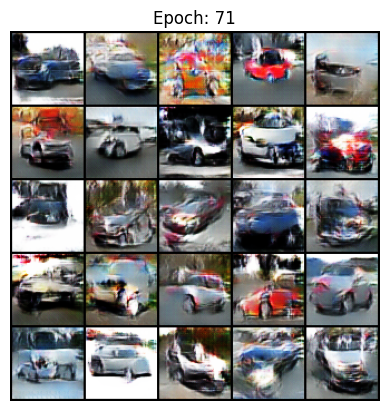

100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 71/200, Generator Loss: 2.39018879213127, Discriminator Loss: 0.3320049257081712


100%|██████████| 64/64 [00:09<00:00,  6.79it/s]


Epoch: 72/200, Generator Loss: 2.4922897663472443, Discriminator Loss: 0.3646577620084721


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 73/200, Generator Loss: 2.3239081285323047, Discriminator Loss: 0.30565412737765807


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 74/200, Generator Loss: 2.337627484896797, Discriminator Loss: 0.4672681165233342


100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 75/200, Generator Loss: 2.3651655291761537, Discriminator Loss: 0.3657228136929173


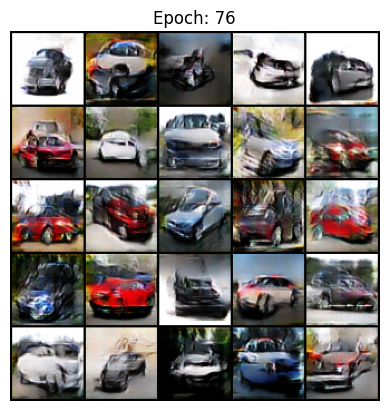

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 76/200, Generator Loss: 2.3508282939671066, Discriminator Loss: 0.351908951119496


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 77/200, Generator Loss: 2.440551016326035, Discriminator Loss: 0.4102385564028397


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 78/200, Generator Loss: 2.2076174931816595, Discriminator Loss: 0.3696642794402971


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 79/200, Generator Loss: 2.280018731980989, Discriminator Loss: 0.29774085061957656


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 80/200, Generator Loss: 2.3298588923246313, Discriminator Loss: 0.47137983878141304


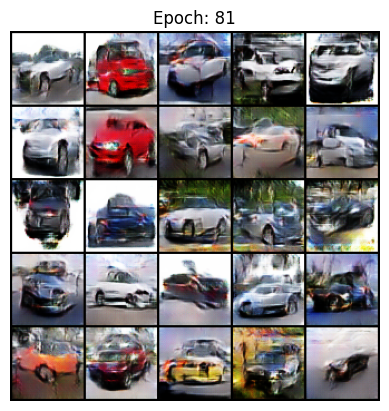

100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 81/200, Generator Loss: 2.266853355939824, Discriminator Loss: 0.33169768449131304


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 82/200, Generator Loss: 2.2656772211633167, Discriminator Loss: 0.33157891146326346


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 83/200, Generator Loss: 2.2887343147180403, Discriminator Loss: 0.3262725579012588


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 84/200, Generator Loss: 2.37811196623242, Discriminator Loss: 0.41294133288452806


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 85/200, Generator Loss: 2.2850879903860783, Discriminator Loss: 0.3099151278877071


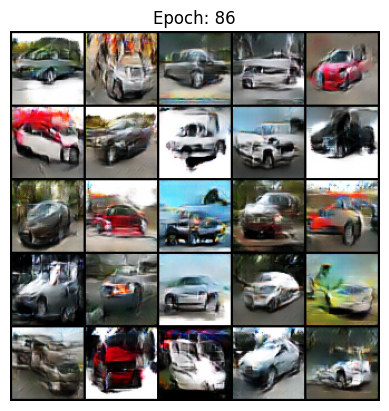

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 86/200, Generator Loss: 2.3914456906159405, Discriminator Loss: 0.41984164773363963


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 87/200, Generator Loss: 2.2420310177831144, Discriminator Loss: 0.3231296439770397


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 88/200, Generator Loss: 2.3460716048954513, Discriminator Loss: 0.29419703960184496


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 89/200, Generator Loss: 2.380132100905323, Discriminator Loss: 0.4454517989823767


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 90/200, Generator Loss: 2.280350335220457, Discriminator Loss: 0.3878548149978248


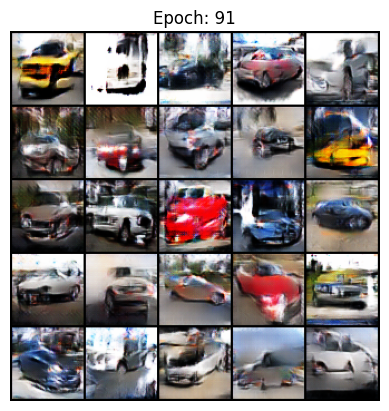

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 91/200, Generator Loss: 2.299691696298146, Discriminator Loss: 0.29155893199336086


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 92/200, Generator Loss: 2.349761943217579, Discriminator Loss: 0.31146323961921196


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 93/200, Generator Loss: 2.328390434120868, Discriminator Loss: 0.35761804489349336


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 94/200, Generator Loss: 2.3891317858443046, Discriminator Loss: 0.27563919692002015


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 95/200, Generator Loss: 2.398215345877327, Discriminator Loss: 0.5218958970020234


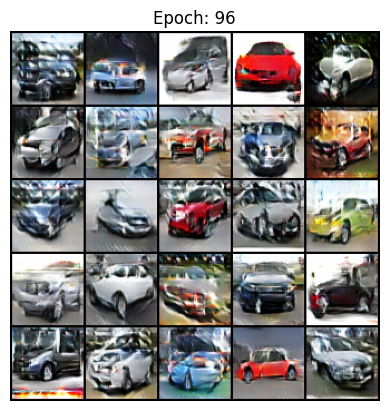

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 96/200, Generator Loss: 2.2875749017962774, Discriminator Loss: 0.32872997888881705


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 97/200, Generator Loss: 2.2635292585331706, Discriminator Loss: 0.2867998329735926


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 98/200, Generator Loss: 2.345578270014705, Discriminator Loss: 0.2907700831388912


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 99/200, Generator Loss: 2.3748100881258023, Discriminator Loss: 0.4207350777385277


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 100/200, Generator Loss: 2.342067311929579, Discriminator Loss: 0.27075029075262824


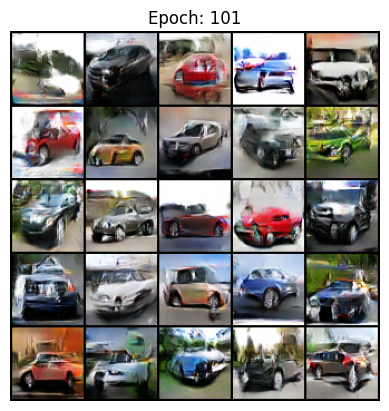

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 101/200, Generator Loss: 2.3403495842909297, Discriminator Loss: 0.45877126913173727


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 102/200, Generator Loss: 2.29555834768329, Discriminator Loss: 0.2879156209162504


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 103/200, Generator Loss: 2.379578840287589, Discriminator Loss: 0.27097335305569914


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 104/200, Generator Loss: 2.4258262745757935, Discriminator Loss: 0.2806661000186193


100%|██████████| 64/64 [00:09<00:00,  6.73it/s]


Epoch: 105/200, Generator Loss: 2.3721954368186604, Discriminator Loss: 0.5942493906658151


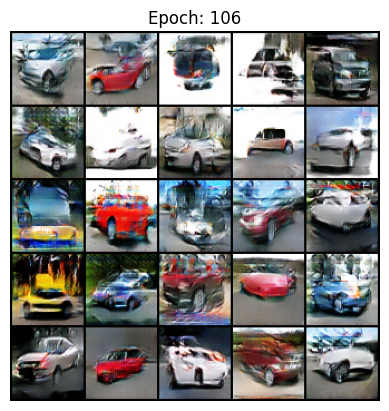

100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 106/200, Generator Loss: 2.279575088871954, Discriminator Loss: 0.3033375817338235


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 107/200, Generator Loss: 2.289248382178646, Discriminator Loss: 0.26771952244059743


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 108/200, Generator Loss: 2.329280575038408, Discriminator Loss: 0.26899080765973377


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 109/200, Generator Loss: 2.3220759138377103, Discriminator Loss: 0.421031161937826


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 110/200, Generator Loss: 2.3706984712004897, Discriminator Loss: 0.27239015885795265


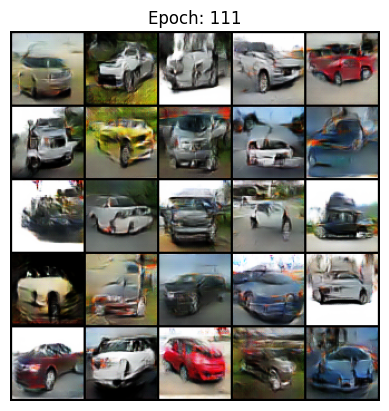

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 111/200, Generator Loss: 2.434008769295773, Discriminator Loss: 0.25223157260647455


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 112/200, Generator Loss: 2.369081941475334, Discriminator Loss: 0.4803869242986668


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 113/200, Generator Loss: 2.3443630275651373, Discriminator Loss: 0.37054477096306554


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 114/200, Generator Loss: 2.3594950219737054, Discriminator Loss: 0.27211078497890406


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 115/200, Generator Loss: 2.4168094881391244, Discriminator Loss: 0.2655729389143833


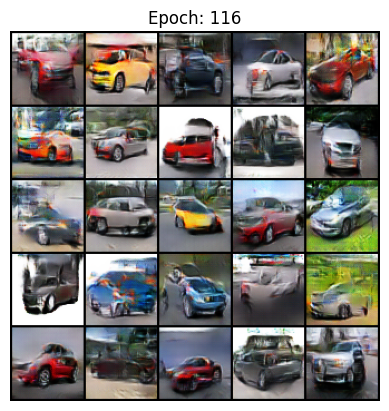

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 116/200, Generator Loss: 2.4537142414475235, Discriminator Loss: 0.2617147253398108


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 117/200, Generator Loss: 2.500497312583249, Discriminator Loss: 0.2526170202697424


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 118/200, Generator Loss: 2.4335938052718906, Discriminator Loss: 0.49545179228417296


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 119/200, Generator Loss: 2.333560347322865, Discriminator Loss: 0.3152420599240451


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 120/200, Generator Loss: 2.4170337276046543, Discriminator Loss: 0.25602610195549624


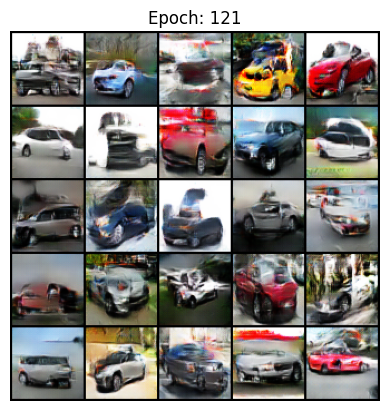

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 121/200, Generator Loss: 2.4576168664546283, Discriminator Loss: 0.24812471140578593


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 122/200, Generator Loss: 2.505913420604114, Discriminator Loss: 0.24927928780291544


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 123/200, Generator Loss: 2.369826138839272, Discriminator Loss: 0.5909027441428546


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 124/200, Generator Loss: 2.277236052721095, Discriminator Loss: 0.2898211885529089


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 125/200, Generator Loss: 2.3494056128331393, Discriminator Loss: 0.2578222212365194


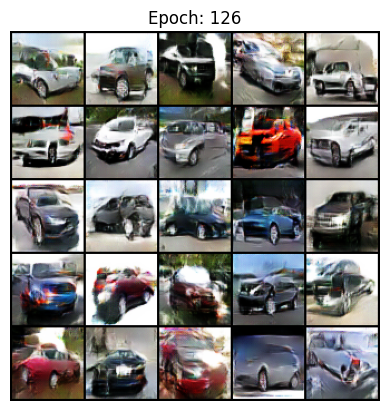

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 126/200, Generator Loss: 2.4115745061038756, Discriminator Loss: 0.2501512083182869


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 127/200, Generator Loss: 2.296813485196157, Discriminator Loss: 0.5372737110949218


100%|██████████| 64/64 [00:09<00:00,  6.79it/s]


Epoch: 128/200, Generator Loss: 2.387921792350724, Discriminator Loss: 0.2615170732930976


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 129/200, Generator Loss: 2.4085932204203426, Discriminator Loss: 0.24541091257322045


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 130/200, Generator Loss: 2.5019887142424966, Discriminator Loss: 0.2473036725886444


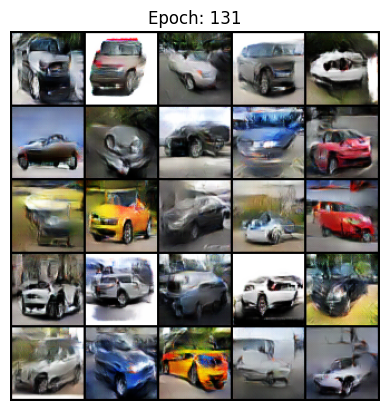

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 131/200, Generator Loss: 2.4355203791545277, Discriminator Loss: 0.5246622779046154


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 132/200, Generator Loss: 2.312620841215542, Discriminator Loss: 0.33537857740941823


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 133/200, Generator Loss: 2.418792396256872, Discriminator Loss: 0.25768670823227446


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 134/200, Generator Loss: 2.5130526012428147, Discriminator Loss: 0.24202946536901657


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 135/200, Generator Loss: 2.5173961451105145, Discriminator Loss: 0.2403946175790723


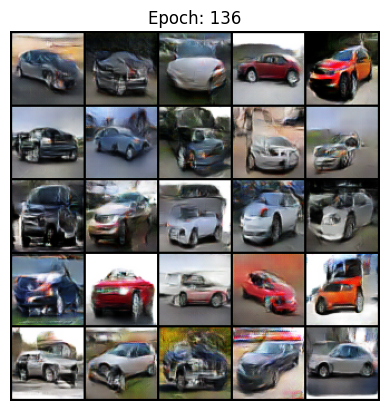

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 136/200, Generator Loss: 2.560778189735937, Discriminator Loss: 0.2468393638817875


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 137/200, Generator Loss: 2.5598788680636813, Discriminator Loss: 0.23773866247802913


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 138/200, Generator Loss: 2.4414976675992865, Discriminator Loss: 0.4776535894289935


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 139/200, Generator Loss: 2.5500061802405036, Discriminator Loss: 0.24840646109787093


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 140/200, Generator Loss: 2.5441466497297607, Discriminator Loss: 0.23367891883686157


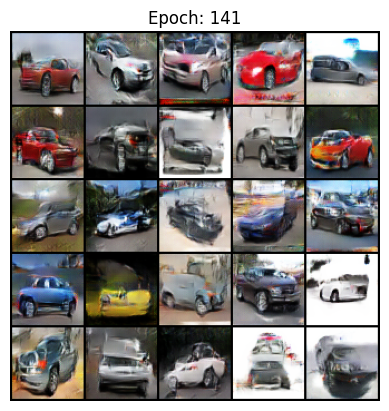

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 141/200, Generator Loss: 2.6264213522665627, Discriminator Loss: 0.23266338789744087


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 142/200, Generator Loss: 2.6168602046891607, Discriminator Loss: 0.23082524122329967


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 143/200, Generator Loss: 2.5648576756591646, Discriminator Loss: 0.4294907088832443


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 144/200, Generator Loss: 2.4932814040212126, Discriminator Loss: 0.305237069462512


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 145/200, Generator Loss: 2.496839229390757, Discriminator Loss: 0.2421780050620583


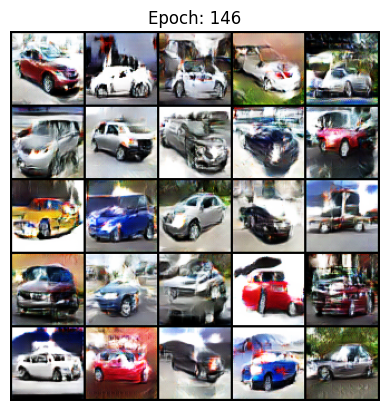

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 146/200, Generator Loss: 2.605781578596074, Discriminator Loss: 0.23365301502711178


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 147/200, Generator Loss: 2.642212960949581, Discriminator Loss: 0.23583835738112743


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 148/200, Generator Loss: 2.7261748107805235, Discriminator Loss: 0.24423884795082107


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 149/200, Generator Loss: 2.4340665176481537, Discriminator Loss: 0.5022052227865268


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 150/200, Generator Loss: 2.5826029894628317, Discriminator Loss: 0.25041852332285675


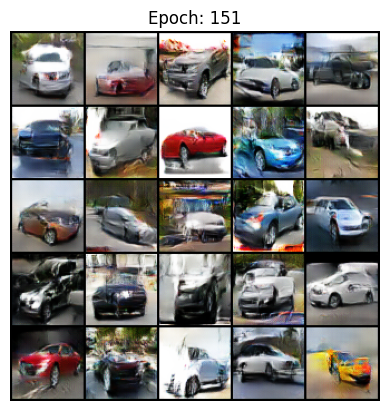

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 151/200, Generator Loss: 2.6074369112962823, Discriminator Loss: 0.23372731672523064


100%|██████████| 64/64 [00:09<00:00,  6.79it/s]


Epoch: 152/200, Generator Loss: 2.6457362488819713, Discriminator Loss: 0.2295291787983158


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 153/200, Generator Loss: 2.651878951340621, Discriminator Loss: 0.3266689520336556


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 154/200, Generator Loss: 2.6129988518585625, Discriminator Loss: 0.3381547845885421


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 155/200, Generator Loss: 2.6234287564553074, Discriminator Loss: 0.23684128082571423


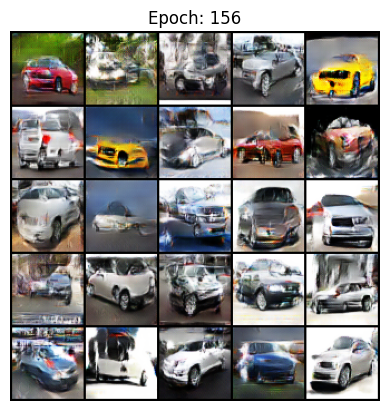

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 156/200, Generator Loss: 2.6914981732434047, Discriminator Loss: 0.22689184587456154


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 157/200, Generator Loss: 2.7323977478829256, Discriminator Loss: 0.22692404696187243


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 158/200, Generator Loss: 2.7199010902865695, Discriminator Loss: 0.22742705366232072


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 159/200, Generator Loss: 2.5049784473913825, Discriminator Loss: 0.4771843240514017


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 160/200, Generator Loss: 2.632862056870826, Discriminator Loss: 0.2399431019728685


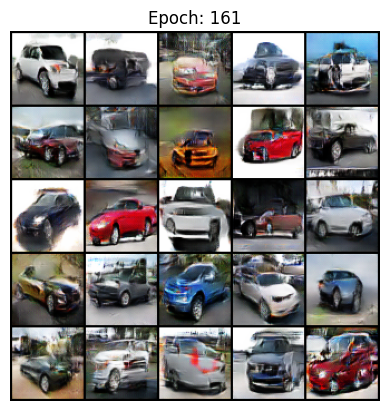

100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 161/200, Generator Loss: 2.708688657738137, Discriminator Loss: 0.22689492950739232


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 162/200, Generator Loss: 2.747077184950673, Discriminator Loss: 0.22373141772854774


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 163/200, Generator Loss: 2.7658247591704423, Discriminator Loss: 0.22394415010169352


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 164/200, Generator Loss: 2.7843057889132696, Discriminator Loss: 0.22160389193851493


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 165/200, Generator Loss: 2.740760263619114, Discriminator Loss: 0.3626878643316932


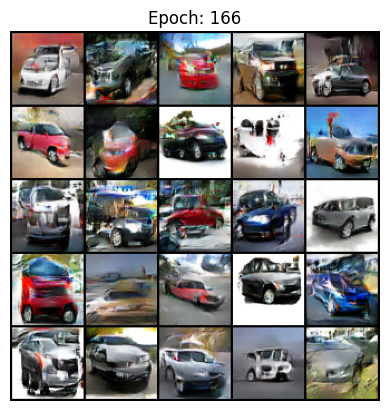

100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 166/200, Generator Loss: 2.43823908120101, Discriminator Loss: 0.45375834531306286


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 167/200, Generator Loss: 2.5964906754334454, Discriminator Loss: 0.24075589110902812


100%|██████████| 64/64 [00:09<00:00,  6.74it/s]


Epoch: 168/200, Generator Loss: 2.686062730365746, Discriminator Loss: 0.22778030644465525


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 169/200, Generator Loss: 2.7452979289244106, Discriminator Loss: 0.22374729346666916


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 170/200, Generator Loss: 2.7681477069854736, Discriminator Loss: 0.22120146596829876


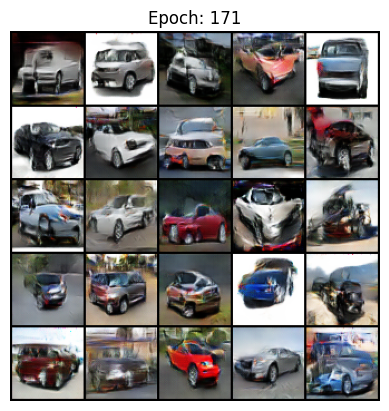

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 171/200, Generator Loss: 2.7591715636562504, Discriminator Loss: 0.22370566225707647


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 172/200, Generator Loss: 2.7982586793206297, Discriminator Loss: 0.22171204389312646


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 173/200, Generator Loss: 2.80343200368825, Discriminator Loss: 0.2215163317492528


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 174/200, Generator Loss: 2.8442519095182885, Discriminator Loss: 0.22527097458338222


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 175/200, Generator Loss: 2.8190782988235386, Discriminator Loss: 0.2245790693169727


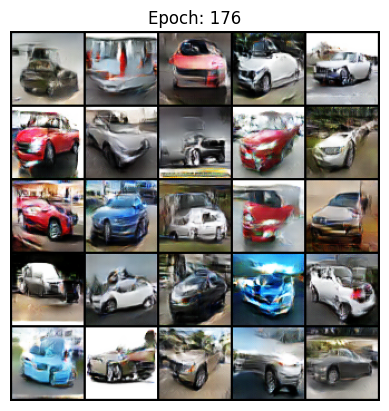

100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 176/200, Generator Loss: 2.5681097095279655, Discriminator Loss: 0.6469672349206591


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 177/200, Generator Loss: 2.3472783078379154, Discriminator Loss: 0.45683667602379807


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 178/200, Generator Loss: 2.495244630896038, Discriminator Loss: 0.2626337801894879


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 179/200, Generator Loss: 2.5974323950956753, Discriminator Loss: 0.23475264905712226


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 180/200, Generator Loss: 2.6487087889598255, Discriminator Loss: 0.23009524276308085


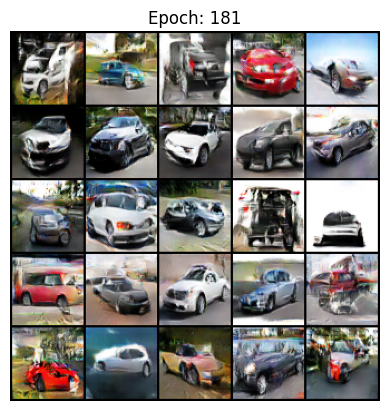

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 181/200, Generator Loss: 2.717415665362345, Discriminator Loss: 0.22505214014081448


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 182/200, Generator Loss: 2.743489365212341, Discriminator Loss: 0.22656981152260935


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 183/200, Generator Loss: 2.7946876875309674, Discriminator Loss: 0.22253713483075027


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 184/200, Generator Loss: 2.8179400341918286, Discriminator Loss: 0.2188744611145237


100%|██████████| 64/64 [00:09<00:00,  6.78it/s]


Epoch: 185/200, Generator Loss: 2.588629691212023, Discriminator Loss: 0.49275254383536826


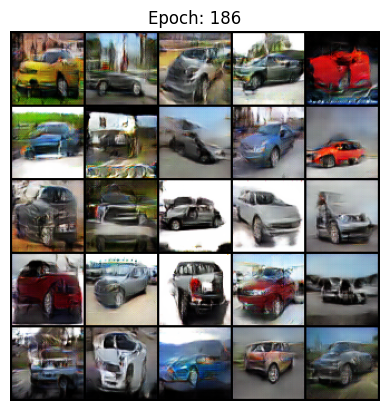

100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 186/200, Generator Loss: 2.535632829066578, Discriminator Loss: 0.3056774267630399


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 187/200, Generator Loss: 2.6870625211119887, Discriminator Loss: 0.2334767026727935


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 188/200, Generator Loss: 2.744901428990842, Discriminator Loss: 0.2240627717761019


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 189/200, Generator Loss: 2.755899087853422, Discriminator Loss: 0.21861230832303202


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 190/200, Generator Loss: 2.83154224927861, Discriminator Loss: 0.21947289488053276


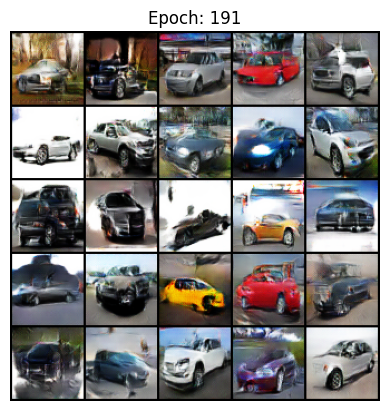

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 191/200, Generator Loss: 2.853767077440363, Discriminator Loss: 0.21873694394801127


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 192/200, Generator Loss: 2.267067013414529, Discriminator Loss: 0.6134501977261954


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 193/200, Generator Loss: 2.6014884286404594, Discriminator Loss: 0.24985739196447587


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 194/200, Generator Loss: 2.696337526579971, Discriminator Loss: 0.2267466954491696


100%|██████████| 64/64 [00:09<00:00,  6.77it/s]


Epoch: 195/200, Generator Loss: 2.7679805493307956, Discriminator Loss: 0.22133382862115422


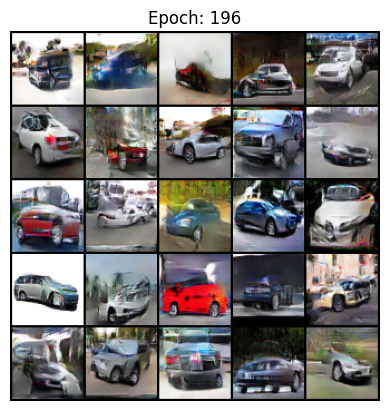

100%|██████████| 64/64 [00:09<00:00,  6.76it/s]


Epoch: 196/200, Generator Loss: 2.7926731029990144, Discriminator Loss: 0.21849964146295558


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 197/200, Generator Loss: 2.808899346878112, Discriminator Loss: 0.21737640736028113


100%|██████████| 64/64 [00:09<00:00,  6.75it/s]


Epoch: 198/200, Generator Loss: 2.8643589455392835, Discriminator Loss: 0.21550988108797953


100%|██████████| 64/64 [00:09<00:00,  6.76it/s]

Epoch: 199/200, Generator Loss: 2.881812382306472, Discriminator Loss: 0.21873857397110383


In [22]:
for i in range(epochs):
    cumulative_gen_loss = 0
    cumulative_disc_loss = 0
    total_data = 0
    for data in tqdm(dataloader):
        data = data.to(device)
        batch_size = len(data)

        # Training the Discriminator
        disc_opt.zero_grad()
        disc_loss_cal = disc_loss(base_loss=loss_fn, gen_model=generator, disc_model=discriminator, real_images=data, z_dim=z_dim, batch_size=batch_size)
        disc_loss_cal.backward()
        disc_opt.step()

        # Train the Generator
        gen_opt.zero_grad()
        gen_loss_calc = gen_loss(base_loss=loss_fn, gen_model=generator, disc_model=discriminator, batch_size=batch_size, z_dim=z_dim)
        gen_loss_calc.backward()
        gen_opt.step()

        # Update the metrics
        cumulative_gen_loss += gen_loss_calc.item() * batch_size
        cumulative_disc_loss += disc_loss_cal.item() * batch_size
        total_data += batch_size
    print(f"Epoch: {i}/{epochs}, Generator Loss: {cumulative_gen_loss/total_data}, Discriminator Loss: {cumulative_disc_loss/total_data}")
    if i%save_freq==0:
        noise = get_noise(batch_size=25, z_dim=z_dim)
        fake_images = generator(noise)*0.5+0.5
        show(fake_images, epoch=i+1, save=True)

In [25]:
def large_ample(tensor, ch = 3, size = (64,64), n_imgs = 64, epoch = 0, save=False):
    data = tensor.detach().cpu().view(-1, ch, *size)
    reshaped = make_grid(data[:n_imgs], nrow=6).permute(1,2,0) # from C,H,W to H,W,C
    plt.figure(figsize=(20,20))
    plt.imshow(reshaped)
    plt.title(f"Sample: {epoch}")
    plt.axis('off')
    if save:
        plt.savefig(f"/kaggle/working/generated_{epoch}.png")
    plt.show()

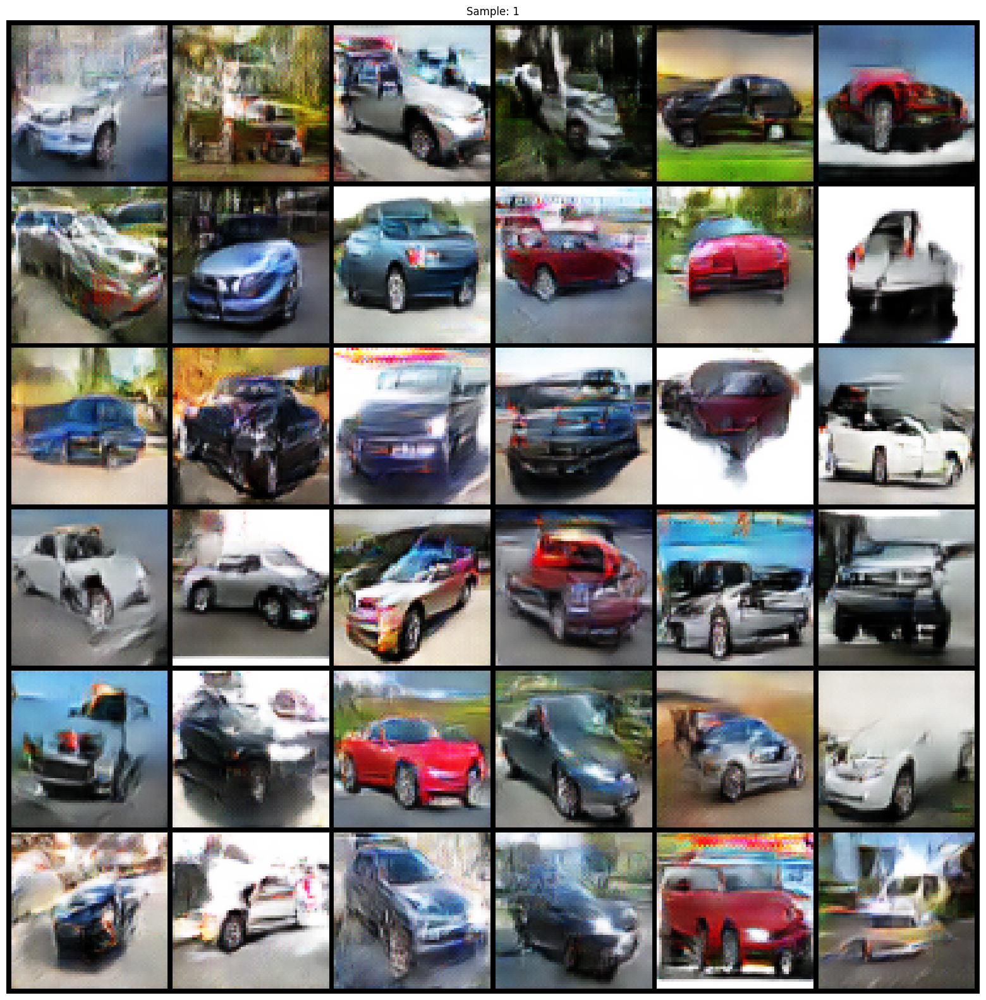

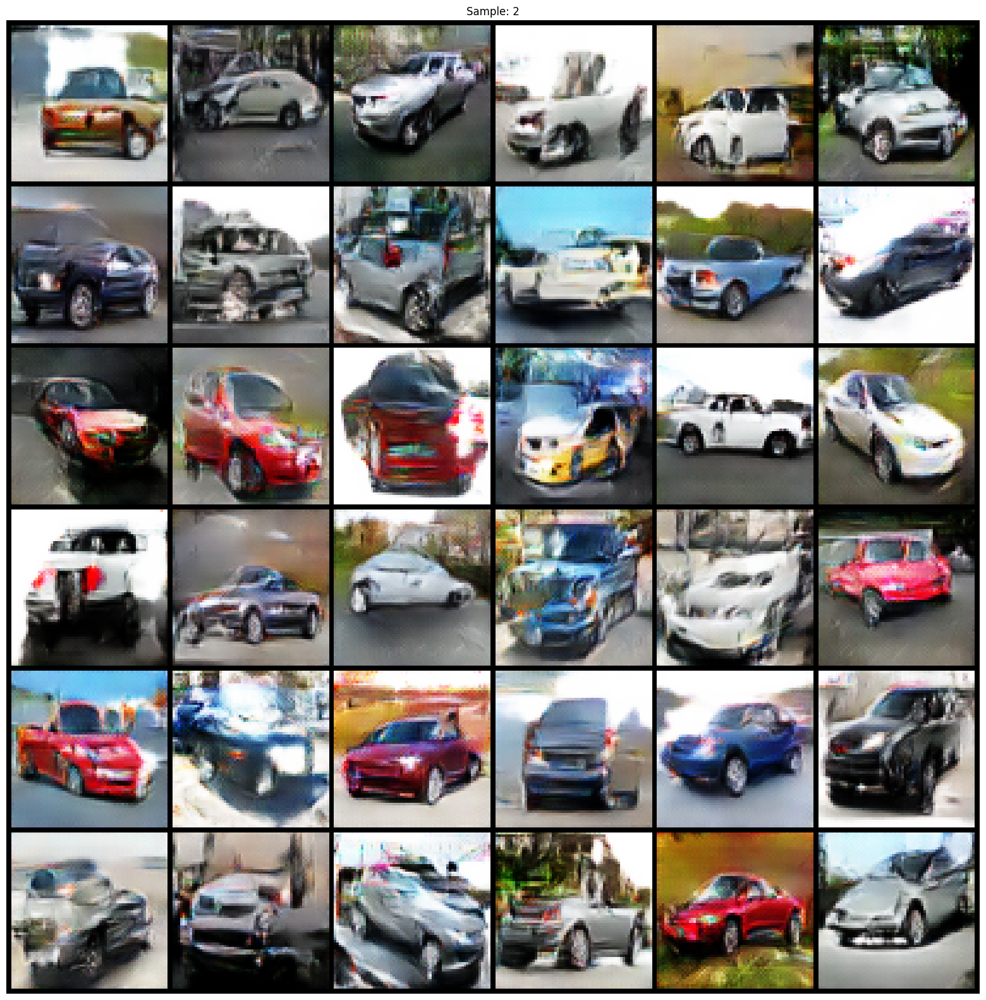

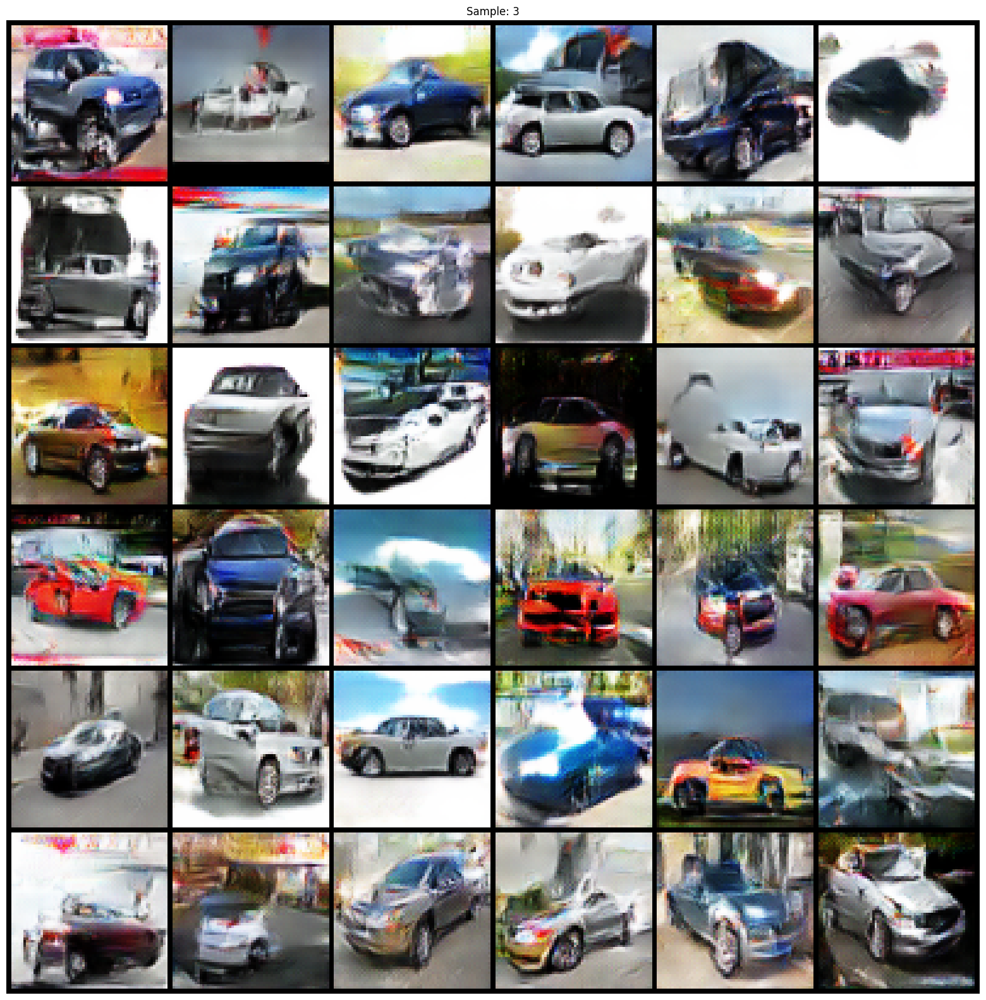

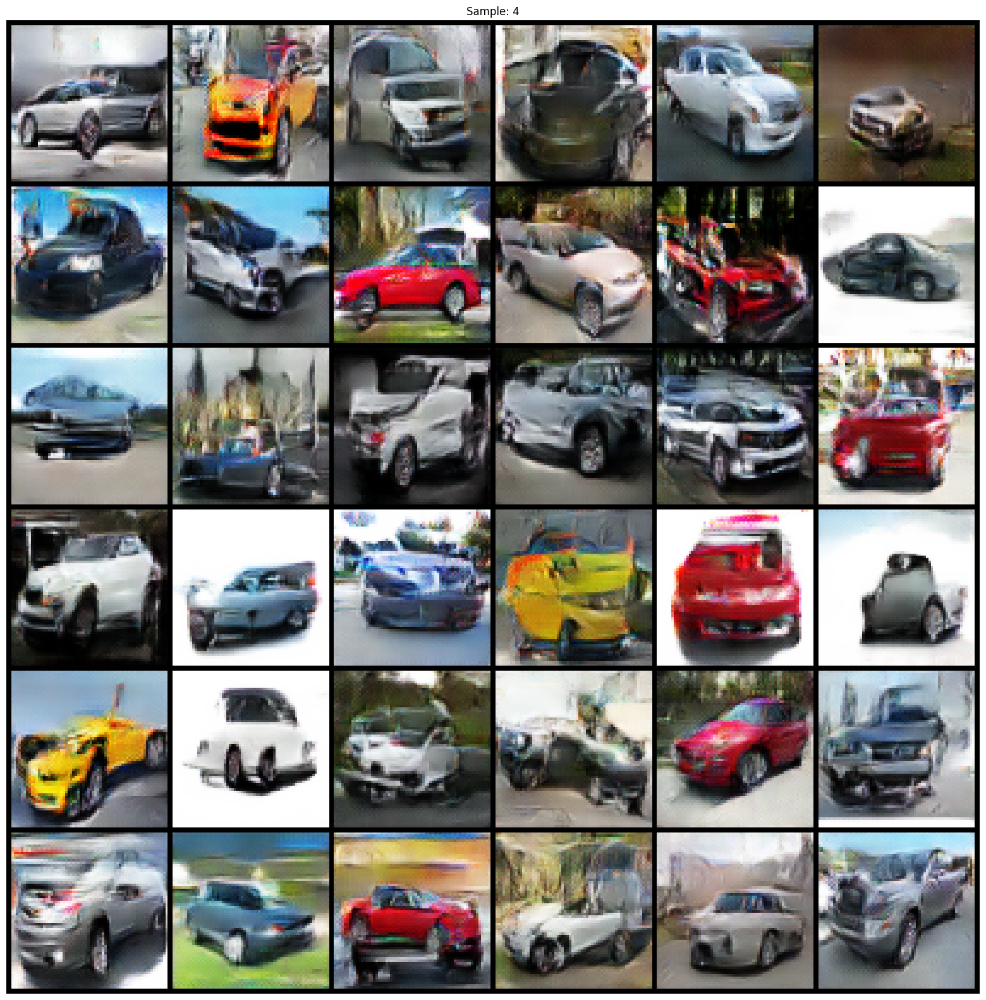

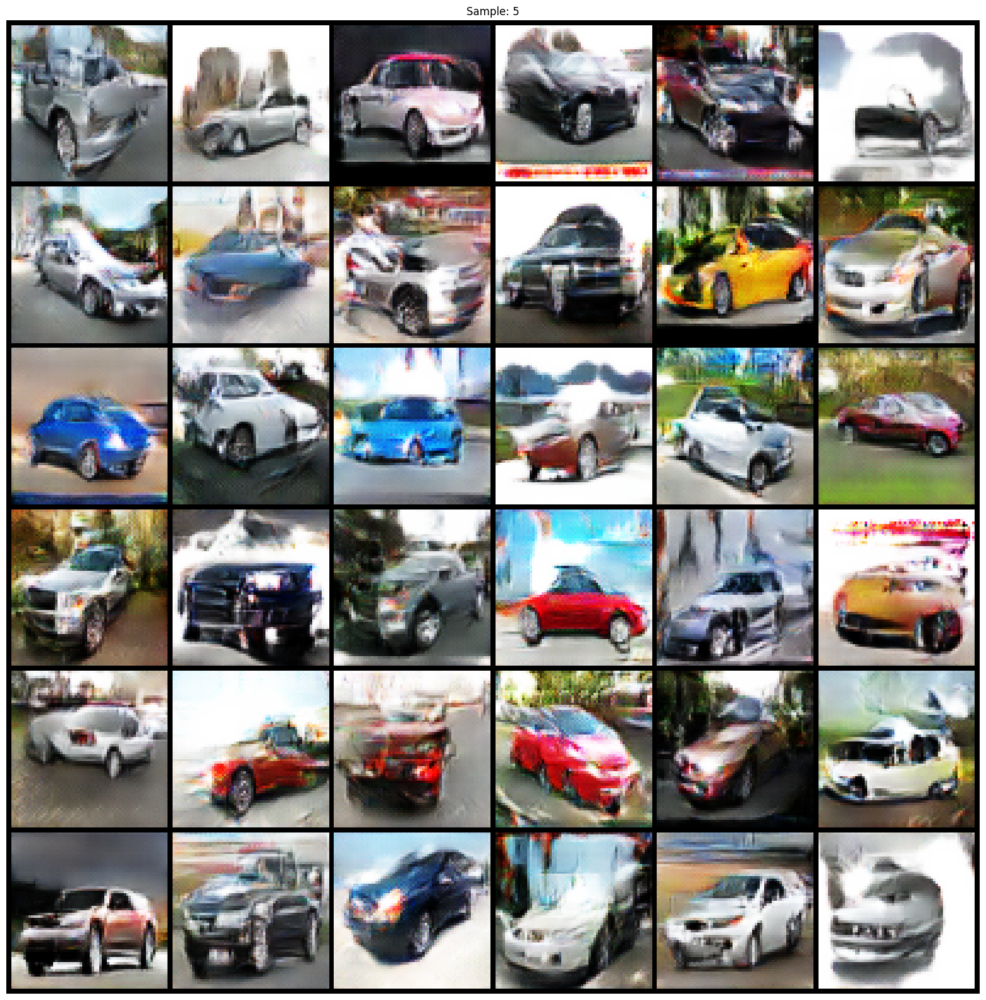

In [27]:
for i in range(5):
    noise = get_noise(36, 100)
    fake = generator(noise)*0.5+0.5
    large_ample(fake, epoch=i+1, save=True)

# Extra Utils - Ignore

In [28]:
images = glob('/kaggle/working/images/*.png')
images.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

In [30]:
imgs = []
for i in images:
    img = Image.open(i)
    imgs.append(img)

In [32]:
imgs.append(imgs[0])

In [35]:
imgs[0].save('DC-GAN.gif', save_all=True, append_images = imgs[1:], duration=500, loop=200)

In [ ]:
import zipfile
import os

def zip_folder(folder_path, output_zip):
    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                abs_path = os.path.join(root, file)
                rel_path = os.path.relpath(abs_path, folder_path)
                zipf.write(abs_path, rel_path)

zip_folder('/kaggle/working/images/', 'images.zip')

  1%|▏         | 104/8144 [1:07:02<86:22:38, 38.68s/it]